In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "Frax"
SPLITS_FREQ = "5d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2022-05-26"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'Frax/LightGCN_5d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,103,5,0.661759,0.660955,0.000804,0.0,0.0,0.0,0.0,1.0,...,147.96.81.131,0.433783,1,7,4,3,0.0076,0.001260,21d,2022-04-11T00:00:00
1,103,10,0.598923,0.597881,0.001042,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,0.585102,2,7,4,3,0.0076,0.001260,21d,2022-04-11T00:00:00
2,103,15,0.496047,0.494644,0.001403,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,0.733332,3,7,4,3,0.0076,0.001260,21d,2022-04-11T00:00:00
3,103,20,0.377171,0.375316,0.001855,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,0.881801,4,7,4,3,0.0076,0.001260,21d,2022-04-11T00:00:00
4,103,25,0.293567,0.291162,0.002405,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,1.040545,5,7,4,3,0.0076,0.001260,21d,2022-04-11T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,103,180,0.221937,0.220219,0.001718,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,5.121305,36,10,1,1,0.0029,0.000699,21d,2022-04-11T00:00:00
36,103,185,0.237641,0.235886,0.001755,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,5.256549,37,10,1,1,0.0029,0.000699,21d,2022-04-11T00:00:00
37,103,190,0.194162,0.192426,0.001736,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,5.390419,38,10,1,1,0.0029,0.000699,21d,2022-04-11T00:00:00
38,103,195,0.199865,0.198109,0.001756,1.0,1.0,1.0,1.0,1.0,...,147.96.81.131,5.521808,39,10,1,1,0.0029,0.000699,21d,2022-04-11T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
7,128,40,12.122354,2.015961,10.106393,1.0,0.333333,0.2,0.1,0.066667,...,1.005899,False,52952304,128,479,2,0.6904,8.921377e-04,60d,2022-04-21
6,128,35,12.014273,0.339439,11.674834,1.0,0.333333,0.2,0.1,0.066667,...,0.881059,False,52952304,128,479,2,0.6904,8.921377e-04,60d,2022-04-21
5,128,30,18.526767,5.815899,12.710868,1.0,0.333333,0.2,0.1,0.066667,...,0.756663,False,52952304,128,479,2,0.6904,8.921377e-04,60d,2022-04-21
23,176,120,0.006818,0.000000,0.006818,1.0,0.333333,0.2,0.1,0.066667,...,2.970112,False,064315dd,512,26,2,0.6694,1.427212e-06,30d,2022-04-21
39,64,200,0.027735,0.027721,0.000015,1.0,0.333333,0.2,0.1,0.066667,...,5.185274,True,4adeae4e,64,8,1,0.0551,1.537178e-07,90d,2022-05-26


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2022-04-11    100
2022-04-16    100
2022-04-21    100
2022-04-26    100
2022-05-01    100
2022-05-06    100
2022-05-11    100
2022-05-16    100
2022-05-21    100
2022-05-26    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
002d0e0c  512                267                   4                   0.0187                1.544014e-07  10YE                2022-04-26     2.794996
00390df4  512                447                   3                   0.0008                1.293014e-04  60d                 2022-04-26     1.236538
00a191d8  256                563                   4                   0.0031                4.357534e-05  90d                 2022-05-16     1.904360
01425b2a  128                58                    3                   0.0588                1.698028e-05  60d                 2022-04-21     1.689905
01a93054  512                18                    4                   0.0001                5.803238e-07  30d                 2022-05-06     1.207055
                                                                                                          

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.0
mean      200.0
std         0.0
min       200.0
25%       200.0
50%       200.0
75%       200.0
max       200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.548305
precision@3        0.332904
precision@5        0.244790
precision@10       0.140967
precision@15       0.093978
precision@100      0.014097
ndcg@1             0.531466
ndcg@3             0.567500
ndcg@5             0.586661
ndcg@10            0.599773
ndcg@15            0.599773
ndcg@100           0.599773
map@1              0.548305
map@3              0.551270
map@5              0.564134
map@10             0.576268
map@15             0.576268
map@100            0.576268
recall@1           0.377675
recall@3           0.576758
recall@5           0.643371
recall@10          0.683535
recall@15          0.683535
recall@100         0.683535
r-precision@1      0.528713
r-precision@3      0.672639
r-precision@5      0.700642
r-precision@10     0.715754
r-precision@15     0.715754
r-precision@100    0.715754
time_eval          0.120818
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.070783
2023-06-05,0.250000,0.500000,0.400000,0.200000,0.133333,0.020000,0.250000,0.597882,0.719590,0.719590,...,1.000000,1.000000,1.000000,0.666667,0.761905,0.761905,0.761905,0.761905,0.761905,0.124659
2023-06-10,0.866667,0.533333,0.320000,0.160000,0.106667,0.016000,0.866667,0.950791,0.950791,0.950791,...,1.000000,1.000000,1.000000,0.653846,1.000000,1.000000,1.000000,1.000000,1.000000,0.125498
2023-06-15,0.857143,0.547619,0.585714,0.478571,0.319048,0.047857,0.857143,0.655228,0.722067,0.853185,...,1.000000,1.000000,1.000000,0.264220,0.405754,0.628638,0.779762,0.779762,0.779762,0.130987
2023-06-20,0.157895,0.192982,0.115789,0.057895,0.038596,0.005789,0.115385,0.135797,0.116398,0.116398,...,0.153509,0.153509,0.153509,0.250000,0.729167,0.729167,0.729167,0.729167,0.729167,0.130180
2023-06-25,0.375000,0.125000,0.075000,0.037500,0.025000,0.003750,0.315789,0.176126,0.146656,0.146656,...,0.130729,0.130729,0.130729,0.348611,0.348611,0.348611,0.348611,0.348611,0.348611,0.131144
2023-06-30,0.709677,0.430108,0.258065,0.129032,0.086022,0.012903,0.709677,0.892851,0.892851,0.892851,...,1.000000,1.000000,1.000000,0.795455,1.000000,1.000000,1.000000,1.000000,1.000000,0.125081
2023-07-05,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.116488
2023-07-10,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.122513


(0.0, 1.0)

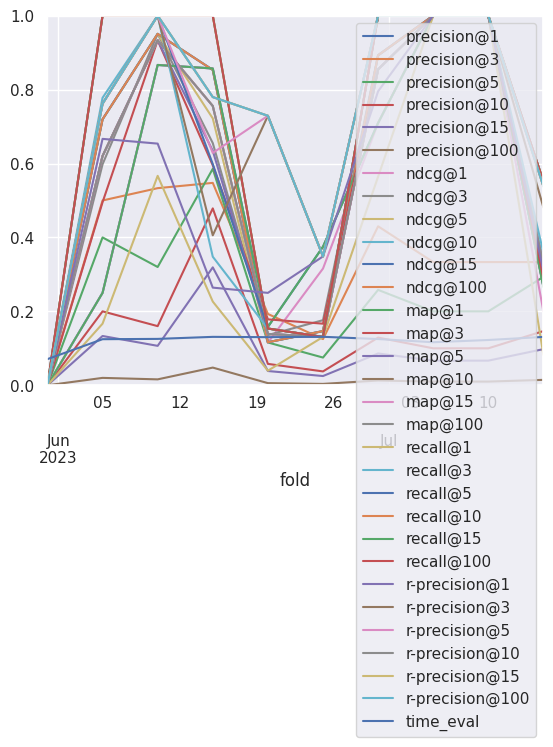

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.900000
precision@3        0.492503
precision@5        0.337824
precision@10       0.178912
precision@15       0.119275
precision@100      0.017891
ndcg@1             0.900000
ndcg@3             0.900000
ndcg@5             0.900000
ndcg@10            0.900000
ndcg@15            0.900000
ndcg@100           0.900000
map@1              0.900000
map@3              0.900000
map@5              0.900000
map@10             0.900000
map@15             0.900000
map@100            0.900000
recall@1           0.657902
recall@3           0.846715
recall@5           0.887046
recall@10          0.900000
recall@15          0.900000
recall@100         0.900000
r-precision@1      0.657902
r-precision@3      0.846715
r-precision@5      0.887046
r-precision@10     0.900000
r-precision@15     0.900000
r-precision@100    0.900000
time_eval          0.126118
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-31,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.073153
2023-06-05,1.0,0.666667,0.400000,0.200000,0.133333,0.020000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.555556,1.000000,1.000000,1.0,1.0,1.0,0.133094
2023-06-10,1.0,0.533333,0.320000,0.160000,0.106667,0.016000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.700000,1.000000,1.000000,1.0,1.0,1.0,0.131236
2023-06-15,1.0,0.880952,0.757143,0.478571,0.319048,0.047857,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.333617,0.679422,0.870465,1.0,1.0,1.0,0.138027
2023-06-20,1.0,0.435897,0.284615,0.142308,0.094872,0.014231,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.887821,0.971154,1.000000,1.0,1.0,1.0,0.131158
2023-06-25,1.0,0.728070,0.568421,0.284211,0.189474,0.028421,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.535526,0.856579,1.000000,1.0,1.0,1.0,0.140534
2023-06-30,1.0,0.430108,0.258065,0.129032,0.086022,0.012903,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.854839,1.000000,1.000000,1.0,1.0,1.0,0.131025
2023-07-05,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.0,1.0,1.0,0.121344
2023-07-10,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.0,1.0,1.0,0.127652


(0.0, 1.0)

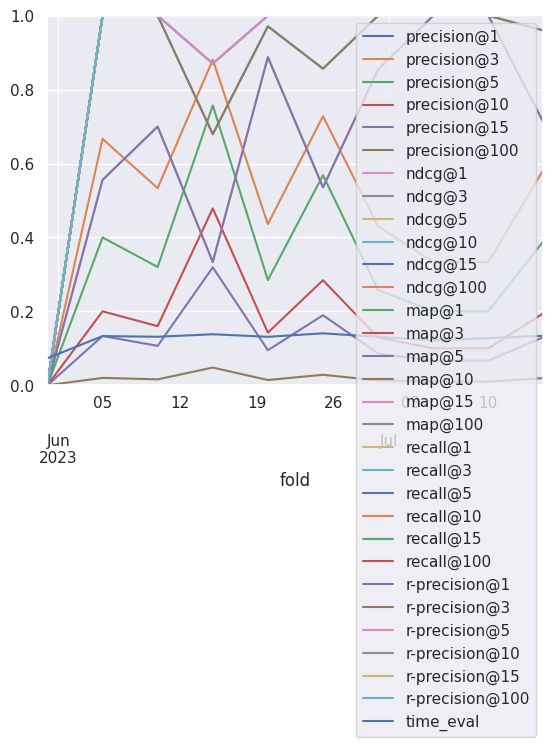

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,103,5,0.661759,0.660955,0.000804,0.0,0.0,0.0,0.0,1.0,...,0.433783,1,7,4,3,0.0076,1.260462e-03,21d,2022-04-11T00:00:00,a0fa17a8
1,64,5,0.656028,0.656021,0.000007,0.0,0.0,0.0,0.0,1.0,...,0.361313,1,6,1,4,0.0116,1.324131e-05,60d,2022-04-11T00:00:00,a9826049
2,256,5,0.156198,0.156177,0.000022,1.0,1.0,1.0,1.0,1.0,...,0.417366,1,8,32,4,0.0150,1.242024e-06,10YE,2022-04-11T00:00:00,cc888fe1
3,117,5,0.673037,0.673032,0.000005,0.0,0.0,0.0,0.0,1.0,...,0.306526,1,7,9,1,0.0005,3.608954e-06,30d,2022-04-11T00:00:00,e16bd0a8
4,256,5,0.030000,0.026557,0.003443,0.0,0.0,0.0,0.0,1.0,...,0.333967,1,8,32,2,0.2795,2.129065e-05,90d,2022-04-11T00:00:00,eac5b727
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,256,5,0.320718,0.320716,0.000002,0.0,0.0,0.0,0.0,1.0,...,0.452002,1,8,1,4,0.3961,1.306389e-07,10YE,2022-05-26T00:00:00,5d4a2543
96,64,5,0.296897,0.259017,0.037880,0.1,0.1,0.1,0.1,1.0,...,0.404071,1,6,3,1,0.0406,6.613724e-03,30d,2022-05-26T00:00:00,536667c8
97,155,5,0.691194,0.690711,0.000483,0.1,0.1,0.1,0.1,1.0,...,0.380102,1,9,3,2,0.0001,1.585058e-03,30d,2022-05-26T00:00:00,1cc4231f
98,132,5,0.078044,0.077957,0.000087,0.0,0.0,0.0,0.0,1.0,...,0.339567,1,9,7,4,0.1593,2.919033e-06,21d,2022-05-26T00:00:00,e60085bf


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-04-11 128        4             3           0.0076        1.260462e-03 21d                  5   
                                                                           21d                 10   
                                                                           21d                 15   
                                                                           21d                 20   
                                                                           21d                 25   
...                                                                                           ...   
2022-05-26 64         8             1           0.0551        1.537178e-07 90d                180   
                                                                           90d                185   
                                                                           90d                190   
                                                                           90d                195   
                                                                           90d                200   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-04-11 128        4             3           0.0076        1.260462e-03 21d          0.661759   
                                                                           21d          0.598923   
                                                                           21d          0.496047   
                                                                           21d          0.377171   
                                                                           21d          0.293567   
...                                                                                          ...   
2022-05-26 64         8             1           0.0551        1.537178e-07 90d          0.028225   
                                                                           90d          0.026131   
                                                                           90d          0.030870   
                                                                           90d          0.033470   
                                                                           90d          0.027735   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-04-11 128        4             3           0.0076        1.260462e-03 21d          0.660955   
                                                                           21d          0.597881   
                                                                           21d          0.494644   
                                                                           21d          0.375316   
                                                                           21d          0.291162   
...                                                                                          ...   
2022-05-26 64         8             1           0.0551        1.537178e-07 90d          0.028211   
                                                                           90d          0.026117   
                                                                           90d          0.030856   
                                                                           90d          0.033456   
                                                                           90d          0.027721   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Frax/models/lightgcn-all_5d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-04-16 512        2             2           0.0196        4.477472e-06 21d                125   
                      665           3           0.0092        2.744564e-05 90d                 20   
                      509           1           0.0009        3.618328e-05 30d                  5   
           1024       2             1           0.0082        1.187863e-03 21d                  5   
           256        11            2           0.0028        2.649736e-04 10YE                90   
...                                                                                           ...   
2022-04-21 1024       4             4           0.0002        7.311851e-07 21d                 25   
           128        267           4           0.8756        6.380533e-03 60d                 70   
                      479           2           0.6904        8.921377e-04 60d                 30   
           512        26            2           0.6694        1.427212e-06 30d                120   
2022-05-26 64         8             1           0.0551        1.537178e-07 90d                200   

                                                                                             loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-04-16 512        2             2           0.0196        4.477472e-06 21d           0.065550   
                      665           3           0.0092        2.744564e-05 90d           0.008733   
                      509           1           0.0009        3.618328e-05 30d           0.559864   
           1024       2             1           0.0082        1.187863e-03 21d           0.670632   
           256        11            2           0.0028        2.649736e-04 10YE          0.072767   
...                                                                                           ...   
2022-04-21 1024       4             4           0.0002        7.311851e-07 21d           0.683554   
           128        267           4           0.8756        6.380533e-03 60d           2.726607   
                      479           2           0.6904        8.921377e-04 60d          18.526767   
           512        26            2           0.6694        1.427212e-06 30d           0.006818   
2022-05-26 64         8             1           0.0551        1.537178e-07 90d           0.027735   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-04-16 512        2             2           0.0196        4.477472e-06 21d          0.065507   
                      665           3           0.0092        2.744564e-05 90d          0.006963   
                      509           1           0.0009        3.618328e-05 30d          0.559748   
           1024       2             1           0.0082        1.187863e-03 21d          0.670058   
           256        11            2           0.0028        2.649736e-04 10YE         0.067488   
...                                                                                          ...   
2022-04-21 1024       4             4           0.0002        7.311851e-07 21d          0.683553   
           128        267           4           0.8756        6.380533e-03 60d          0.382483   
                      479           2           0.6904        8.921377e-04 60d          5.815899   
           512        26            2           0.6694        1.427212e-06 30d          0.000000   
2022-05-26 64         8             1           0.0551        1.537178e-07 90d          0.027721   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learnin

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Frax/models/lightgcn-best-val_5d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2022-04-11,1024,22,3,0.3536,2.197523e-07,60d,80,0.013498,0.013216,0.000282,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001413,0.568934,1.921568,False,809b2d6a
2022-04-16,256,10,2,0.0009,2.104058e-04,21d,5,0.677350,0.677080,0.000270,0.625000,0.513889,0.358333,0.179167,0.119444,0.017917,0.625000,...,0.813725,0.813725,0.813725,0.813725,0.813725,0.020554,0.180459,0.130969,False,448bbc93
2022-04-21,512,26,2,0.6694,1.427212e-06,30d,120,0.006818,0.000000,0.006818,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002265,0.621484,2.970112,False,064315dd
2022-04-26,512,57,2,0.9143,5.993467e-07,90d,75,0.675417,0.662353,0.013063,0.951220,0.414634,0.248780,0.124390,0.082927,0.012439,0.951220,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001542,0.735679,1.957764,False,612e1448
2022-05-01,1024,6,4,0.0006,1.596147e-05,30d,185,0.451627,0.451579,0.000048,0.906250,0.427083,0.256250,0.128125,0.085417,0.012813,0.906250,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001202,0.854335,4.619370,False,d741ce1a
2022-05-06,1024,364,2,0.0002,2.081125e-06,90d,30,0.564202,0.564195,0.000007,1.000000,0.518519,0.311111,0.155556,0.103704,0.015556,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002210,0.369795,0.774441,False,a699d11f
2022-05-11,128,10,3,0.0571,1.102282e-07,10YE,75,0.033435,0.033425,0.000010,1.000000,0.428571,0.257143,0.128571,0.085714,0.012857,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001758,3.547602,1.939546,False,fc573b11
2022-05-16,1024,3,3,0.6042,1.767161e-04,60d,115,0.167494,0.160126,0.007367,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001586,0.785494,2.914861,False,032a352a
2022-05-21,64,277,2,0.9878,8.980250e-03,21d,25,20.942121,4.451937,16.490184,0.923077,0.397436,0.238462,0.119231,0.079487,0.011923,0.923077,...,0.979167,0.979167,0.979167,0.979167,0.979167,0.001876,0.363705,0.628436,False,4b373317


,precision@5,map@10
count,10.000000,10.000000
mean,0.247008,0.965308
std,0.053339,0.071517
min,0.200000,0.769213
25%,0.200000,0.960249
50%,0.243621,1.000000
75%,0.256920,1.000000
max,0.358333,1.000000


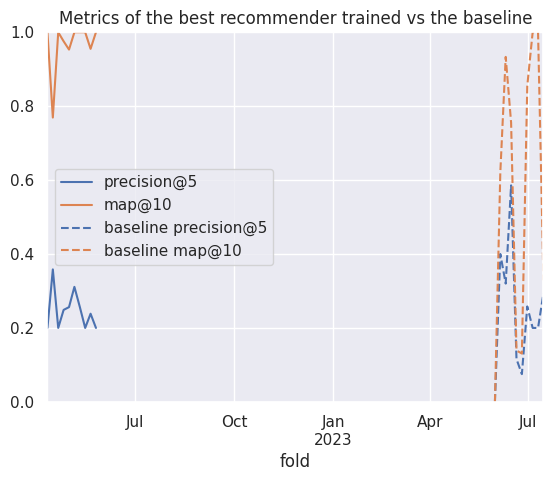

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.247008
ndcg@5          0.975692
precision@10    0.123504
ndcg@10         0.975692
map@5           0.965308
map@10          0.965308
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,103,5,0.661759,0.660955,0.000804,1.0,0.333333,0.2,0.1,0.066667,...,0.191971,False,a0fa17a8,128,4,3,0.0076,1.260462e-03,21d,2022-04-11
1,103,10,0.598923,0.597881,0.001042,1.0,0.333333,0.2,0.1,0.066667,...,0.315086,False,a0fa17a8,128,4,3,0.0076,1.260462e-03,21d,2022-04-11
2,103,15,0.496047,0.494644,0.001403,1.0,0.333333,0.2,0.1,0.066667,...,0.431836,False,a0fa17a8,128,4,3,0.0076,1.260462e-03,21d,2022-04-11
3,103,20,0.377171,0.375316,0.001855,1.0,0.333333,0.2,0.1,0.066667,...,0.551510,False,a0fa17a8,128,4,3,0.0076,1.260462e-03,21d,2022-04-11
4,103,25,0.293567,0.291162,0.002405,1.0,0.333333,0.2,0.1,0.066667,...,0.680941,False,a0fa17a8,128,4,3,0.0076,1.260462e-03,21d,2022-04-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,64,180,0.028225,0.028211,0.000014,1.0,0.333333,0.2,0.1,0.066667,...,4.657020,False,4adeae4e,64,8,1,0.0551,1.537178e-07,90d,2022-05-26
36,64,185,0.026131,0.026117,0.000014,1.0,0.333333,0.2,0.1,0.066667,...,4.798060,False,4adeae4e,64,8,1,0.0551,1.537178e-07,90d,2022-05-26
37,64,190,0.030870,0.030856,0.000014,1.0,0.333333,0.2,0.1,0.066667,...,4.926128,False,4adeae4e,64,8,1,0.0551,1.537178e-07,90d,2022-05-26
38,64,195,0.033470,0.033456,0.000015,1.0,0.333333,0.2,0.1,0.066667,...,5.056105,False,4adeae4e,64,8,1,0.0551,1.537178e-07,90d,2022-05-26


Index intersection: MultiIndex([( 512,  86, 2, '0.0006000000000000001', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 128,  97, 4, '0.0021000000000000003', ...),
            ( 512,  26, 2,                '0.6694', ...),
            (1024,   1, 1, '0.0029000000000000002', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            ( 256,  27, 2,                '0.2056', ...),
            ( 128,  74, 2,                '0.1736', ...),
            (1024, 332, 3,                '0.4863', ...),
            ...
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            ( 128,  34, 2,                '0.0091', ...),
            ( 256, 219, 4,                 '0.095', ...),
            (1024, 332, 3,                '0.4863', ...),
            ( 512,  86, 3,                '0.0002', ...),
            (1024,   1, 1, '0.002900

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2             config/window_size config/fold                    
512               86                   2                  0.0006000000000000001 0.0013432538444605776 21d                2022-04-16               108   
                                                                                                                         2022-04-16               108   
                                                                                                                         2022-04-16               108   
                                                                                                                         2022-04-16               108   
                                                                                                                         2022-04-16               108   
...                                                                                                                                               ...   
                  7                    4                  0.1593                2.91903327474456e-06  21d                2022-05-26               132   
                                                                                                                         2022-05-26               132   
                                                                                                                         2022-05-26               132   
                                                                                                                         2022-05-26               132   
                                                                                                                         2022-05-26               132   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2             config/window_size config/fold                     
512               86                   2                  0.0006000000000000001 0.0013432538444605776 21d                2022-04-16                  5   
                                                                                                                         2022-04-16                 10   
                                                                                                                         2022-04-16                 15   
                                                                                                                         2022-04-16                 20   
                                                                                                                         2022-04-16                 25   
...                                                                                                                                                ...   
                  7                    4                  0.1593                2.91903327474456e-06  21d                2022-05-26                180   
                                                                                                                         2022-05-26                185   
                                                                                                                         2022-05-26                190   
                                                                                                                         2022-05-26                195   
                                                                                                                         2022-05-26                200   

                                                                                                                                          los

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_1520680/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                    
256               32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2022-04-16               256   
                  10                   2                  0.0009000000000000001 0.00021040583577294823 21d                2022-04-21               108   
                  32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2022-04-26               256   
64                217                  2                  0.47850000000000004   2.539908649333967e-06  21d                2022-05-01                64   
1024              6                    4                  0.0006000000000000001 3.6794807500563657e-06 30d                2022-05-06               192   
                  332                  3                  0.4863                0.0022115851672258576  10YE               2022-05-11               716   
256               219                  4                  0.095                 0.0002612310958370494  60d                2022-05-16               256   
                  27                   2                  0.2056                3.060064883897499e-05  30d                2022-05-21               209   
64                217                  2                  0.47850000000000004   2.539908649333967e-06  21d                2022-05-26                64   

                                                                                                                                       config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                     
256               32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2022-04-16                  5   
                  10                   2                  0.0009000000000000001 0.00021040583577294823 21d                2022-04-21                  5   
                  32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2022-04-26                  5   
64                217                  2                  0.47850000000000004   2.539908649333967e-06  21d                2022-05-01                  5   
1024              6                    4                  0.0006000000000000001 3.6794807500563657e-06 30d                2022-05-06                175   
                  332                  3                  0.4863                0.0022115851672258576  10YE               2022-05-11                 25   
256               219                  4                  0.095                 0.0002612310958370494  60d                2022-05-16                 10   
                  27                   2                  0.2056                3.060064883897499e-05  30d                2022-05-21                  5   
64                217                  2                  0.47850000000000004   2.539908649333967e-06  21d                2022-05-26                135   

                                                                                                                                           loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold             
256               32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2022-04-16   0.156198   
                  10                   2                  0.0009000000000000001 0.00021040583577294823 21d                2022-04-21   0.677350   
                  32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2022-04-26   0.142879   

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 217, 2, 0.47850000000000004, 2.539908649333967e-06, 21d, 2022-05-01 00:00:00)       40
(64, 217, 2, 0.47850000000000004, 2.539908649333967e-06, 21d, 2022-05-26 00:00:00)       40
(256, 10, 2, 0.0009000000000000001, 0.00021040583577294823, 21d, 2022-04-21 00:00:00)    40
(256, 27, 2, 0.2056, 3.060064883897499e-05, 30d, 2022-05-21 00:00:00)                    40
(256, 32, 4, 0.015000000000000001, 1.242023640083893e-06, 10YE, 2022-04-16 00:00:00)     40
(256, 32, 4, 0.015000000000000001, 1.242023640083893e-06, 10YE, 2022-04-26 00:00:00)     40
(256, 219, 4, 0.095, 0.0002612310958370494, 60d, 2022-05-16 00:00:00)                    40
(1024, 6, 4, 0.0006000000000000001, 3.6794807500563657e-06, 30d, 2022-05-06 00:00:00)    40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2022-05-11 00:00:00)                 40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2022-04-16,256,32,4,0.015000000000000001,1.242023640083893e-06,10YE,256,5,0.157397,0.157375,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.023421,0.259056,0.123484,False,cc888fe1
2022-04-21,256,10,2,0.0009000000000000001,0.00021040583577294823,21d,149,5,0.676226,0.675985,...,0.813725,0.813725,0.813725,0.813725,0.813725,0.020554,0.180459,0.130969,False,448bbc93
2022-04-26,256,32,4,0.015000000000000001,1.242023640083893e-06,10YE,256,5,0.136042,0.136018,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.022099,0.253825,0.126852,False,e8169b0e
2022-05-01,64,217,2,0.47850000000000004,2.539908649333967e-06,21d,64,5,0.995922,0.989774,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.019984,0.209788,0.128996,False,2871d9cf
2022-05-06,1024,6,4,0.0006000000000000001,3.6794807500563657e-06,30d,205,175,0.424758,0.424743,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002067,0.842842,4.432357,False,61f88446
2022-05-11,1024,332,3,0.4863,0.0022115851672258576,10YE,731,25,2.611658,0.637905,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002411,0.469168,0.646741,False,58ef1768
2022-05-16,256,219,4,0.095,0.0002612310958370494,60d,256,10,0.039207,0.004680,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001651,0.252743,0.264945,False,8aac14e9
2022-05-21,256,27,2,0.2056,3.060064883897499e-05,30d,186,5,0.013927,0.010897,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.024831,0.183804,0.124797,False,668f0aa0
2022-05-26,64,217,2,0.47850000000000004,2.539908649333967e-06,21d,64,135,0.099431,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001515,1.375249,3.506156,False,e917137b


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Frax/models/lightgcn-best-test_5d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.252231,0.875828
std,0.053794,0.141542
min,0.200000,0.575347
25%,0.200000,0.828125
50%,0.248780,0.892857
75%,0.257143,1.000000
max,0.358333,1.000000


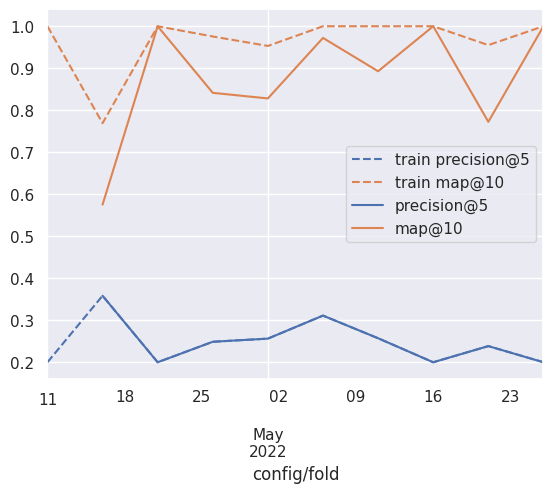

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2022-04-16 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.070783
2023-06-05,0.250000,0.500000,0.400000,0.200000,0.133333,0.020000,0.250000,0.597882,0.719590,0.719590,...,1.000000,1.000000,1.000000,0.666667,0.761905,0.761905,0.761905,0.761905,0.761905,0.124659
2023-06-10,0.866667,0.533333,0.320000,0.160000,0.106667,0.016000,0.866667,0.950791,0.950791,0.950791,...,1.000000,1.000000,1.000000,0.653846,1.000000,1.000000,1.000000,1.000000,1.000000,0.125498
2023-06-15,0.857143,0.547619,0.585714,0.478571,0.319048,0.047857,0.857143,0.655228,0.722067,0.853185,...,1.000000,1.000000,1.000000,0.264220,0.405754,0.628638,0.779762,0.779762,0.779762,0.130987
2023-06-20,0.157895,0.192982,0.115789,0.057895,0.038596,0.005789,0.115385,0.135797,0.116398,0.116398,...,0.153509,0.153509,0.153509,0.250000,0.729167,0.729167,0.729167,0.729167,0.729167,0.130180
2023-06-25,0.375000,0.125000,0.075000,0.037500,0.025000,0.003750,0.315789,0.176126,0.146656,0.146656,...,0.130729,0.130729,0.130729,0.348611,0.348611,0.348611,0.348611,0.348611,0.348611,0.131144
2023-06-30,0.709677,0.430108,0.258065,0.129032,0.086022,0.012903,0.709677,0.892851,0.892851,0.892851,...,1.000000,1.000000,1.000000,0.795455,1.000000,1.000000,1.000000,1.000000,1.000000,0.125081
2023-07-05,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.116488
2023-07-10,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.122513


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.34 & 0.18 & 0.89 & 0.90 & 0.90 & 0.90 & 0.90 & 0.90 \\
Leaky GNN & 0.25 & 0.13 & 1.00 & 1.00 & 0.96 & 0.96 & 0.97 & 0.97 \\
GNN & 0.25 & 0.13 & 1.00 & 1.00 & 0.88 & 0.88 & 0.91 & 0.91 \\
OpenPop & 0.24 & 0.14 & 0.64 & 0.68 & 0.56 & 0.58 & 0.59 & 0.60 \\
\end{tabular}



/tmp/ipykernel_1520680/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_1520680/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             map@5           10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@10         10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@5          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@10    10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@5     10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@10       10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@5        10  2023-06-22 12:00:00  2023-05-31 00:00:00   
Leaky GNN    map@10           9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             map@5            9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             ndcg@10          9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             ndcg@5           9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             precision@10     9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             precision@5      9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             recall@10        9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             recall@5         9  2022-05-06 00:00:00  2022-04-16 00:00:00   
GNN          map@10           9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             map@5            9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             ndcg@10          9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             ndcg@5           9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             precision@10     9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             precision@5      9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             recall@10        9  2022-05-06 00:00:00  2022-04-16 00:00:00   
             recall@5         9  2022-05-06 00:00:00  2022-04-16 00:00:00   
OpenPop      map@10          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             map@5           10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@10         10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@5          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@10    10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@5     10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@10       10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@5        10  2023-06-22 12:00:00  2023-05-31 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-11 06:00:00  2023-06-22 12:00:00   
             map@5         2023-06-11 06:00:00  2023-06-22 12:00:00   
             ndcg@10       2023-06-11 06:00:00  2023-06-22 12:00:00   
             ndcg@5        2023-06-11 06:00:00  2023-06-22 12:00:00   
             precision@10  2023-06-11 06:00:00  2023-06-22 12:00:00   
             precision@5   2023-06-11 06:00:00  2023-06-22 12:00:00   
             recall@10     2023-06-11 06:00:00  2023-06-22 12:00:00   
             recall@5      2023-06-11 06:00:00  2023-06-22 12:00:00   
Leaky GNN    map@10        2022-04-26 00:00:00  2022-05-06 00:00:00   
             map@5         2022-04-26 00:00:00  2022-05-06 00:00:00   
             ndcg@10       2022-04-26 00:00:00  2022-05-06 00:00:00   
             ndcg@5        2022-04-26 00:00:00  2022-05-06 00:00:00   
             precision@10  2022-04-26 00:00:00  2022-05-06 00:00:00   
             precision@5   2022-04-26 00:00:00  2022-05-06 00:00:00   
             recall@10     2022-04-26 00:00:00  2022-05-06 00:00:00   
             recall@5      2022-04-26 00:00:00  2022-

/tmp/ipykernel_1520680/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1520680/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  0.900000  0.316228  0.000000  1.000000   
             precision@5   10.0  0.337824  0.210084  0.000000  0.214516   
Leaky GNN    map@10        10.0  0.965308  0.071517  0.769213  0.960249   
             precision@5   10.0  0.247008  0.053339  0.200000  0.200000   
GNN          map@10         9.0  0.875828  0.141542  0.575347  0.828125   
             precision@5    9.0  0.252231  0.053794  0.200000  0.200000   
OpenPop      map@10        10.0  0.576268  0.391776  0.000000  0.186389   
             precision@5   10.0  0.244790  0.169284  0.000000  0.136842   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.302308  0.397500  0.757143  
Leaky GNN    map@10       1.000000  1.000000  1.000000  
             precision@5  0.243621  0.256920  0.358333  
GNN          map@10       0.892857  1.000000  1.000000  
             precision@5  0.248780  0.257143  0.358333  
OpenPop      map@10       0.687999  0.913710  1.000000  
             precision@5  0.229032  0.313333  0.585714

Cannot show ipywidgets in text

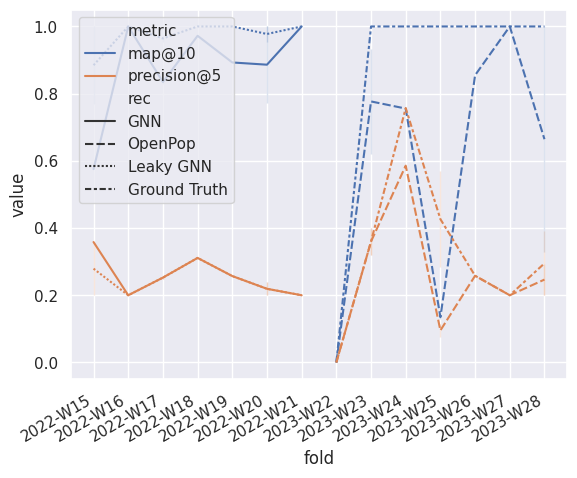

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_1520680/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1520680/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.337824,0.210084,0.0,0.214516,0.302308,0.397500,0.757143
GNN,precision@5,9.0,0.252231,0.053794,0.2,0.200000,0.248780,0.257143,0.358333
OpenPop,precision@5,10.0,0.244790,0.169284,0.0,0.136842,0.229032,0.313333,0.585714


Cannot show ipywidgets in text

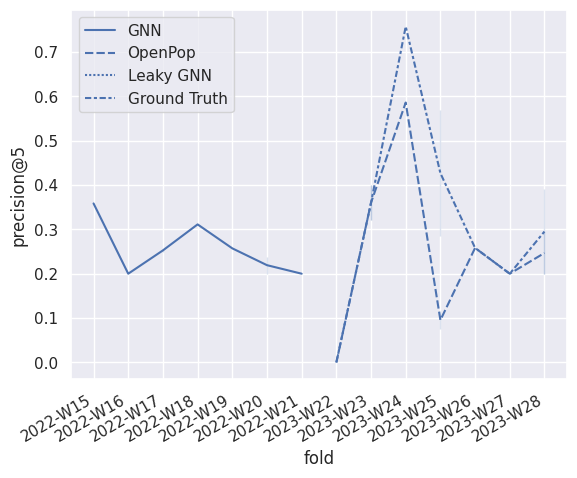

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_1520680/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1520680/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.337824,0.210084,0.0,0.214516,0.302308,0.397500,0.757143
Leaky GNN,precision@5,9.0,0.252231,0.053794,0.2,0.200000,0.248780,0.257143,0.358333
GNN,precision@5,9.0,0.252231,0.053794,0.2,0.200000,0.248780,0.257143,0.358333
OpenPop,precision@5,10.0,0.244790,0.169284,0.0,0.136842,0.229032,0.313333,0.585714


Cannot show ipywidgets in text

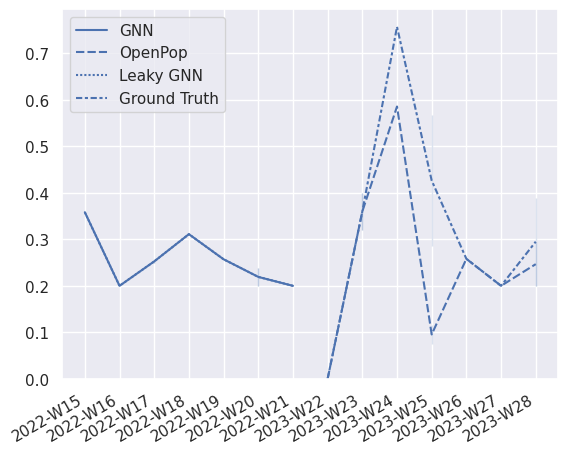

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_1520680/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1520680/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.00000,1.0
GNN,map@10,9.0,0.875828,0.141542,0.575347,0.828125,0.892857,1.00000,1.0
OpenPop,map@10,10.0,0.576268,0.391776,0.000000,0.186389,0.687999,0.91371,1.0


Cannot show ipywidgets in text

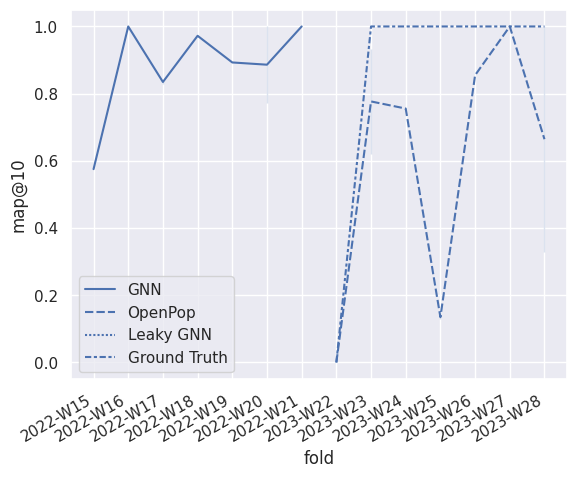

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_1520680/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1520680/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.0
GNN,ndcg@10,9.0,0.909300,0.102064,0.696026,0.873132,0.920914,1.000000,1.0
OpenPop,ndcg@10,10.0,0.599773,0.406337,0.000000,0.189557,0.786387,0.936306,1.0


Cannot show ipywidgets in text

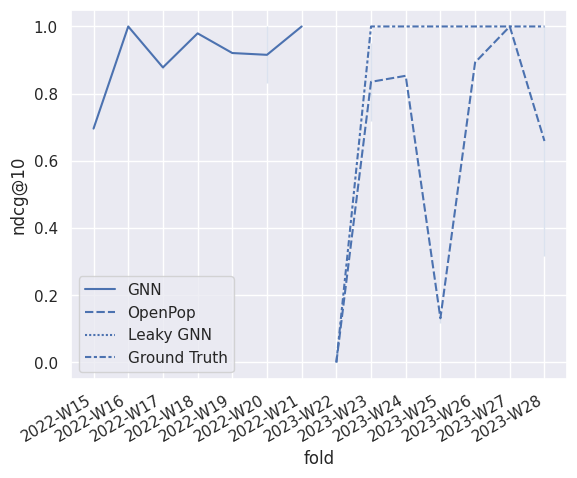

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_1520680/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1520680/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.0
Leaky GNN,ndcg@10,9.0,0.972992,0.051510,0.841005,0.968522,1.000000,1.000000,1.0
GNN,ndcg@10,9.0,0.909300,0.102064,0.696026,0.873132,0.920914,1.000000,1.0
OpenPop,ndcg@10,10.0,0.599773,0.406337,0.000000,0.189557,0.786387,0.936306,1.0


Cannot show ipywidgets in text

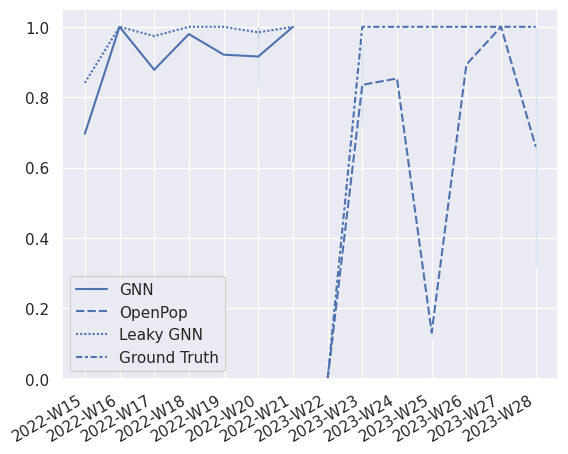

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')